In [21]:
# Import neccesary pacakges
import os
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from sklearn.metrics import confusion_matrix, precision_score
from sklearn.metrics import accuracy_score

> Load the in the images in the train and validation data

In [2]:
# Specify the path to the train folder
#train_folder = 'C:/Users/sofiy/vehicle_dataset/Train'

# Define the image data generator for the train set
datagen = ImageDataGenerator(rescale=1.0/255)

# Load the images from the train folder using the data generator
train_generator = datagen.flow_from_directory(
    os.path.join("C:/Users/sofiy/vehicle_dataset/Train"), # path to train folder
    target_size=(64, 64),
    batch_size=1,
    class_mode='categorical',
    shuffle= False
)

# Define the image data generator for the validation set
validation_datagen = ImageDataGenerator(rescale=1.0/255)

# Load the images from the validation folder using the data generator
validation_generator = validation_datagen.flow_from_directory(
    os.path.join("C:/Users/sofiy/vehicle_dataset/Validation"),    # Path to validation folder
    target_size=(64, 64),
    batch_size=1,
    class_mode='categorical',
    shuffle=False
)

Found 3394 images belonging to 6 classes.
Found 1127 images belonging to 6 classes.


> Randomly display an image from each class

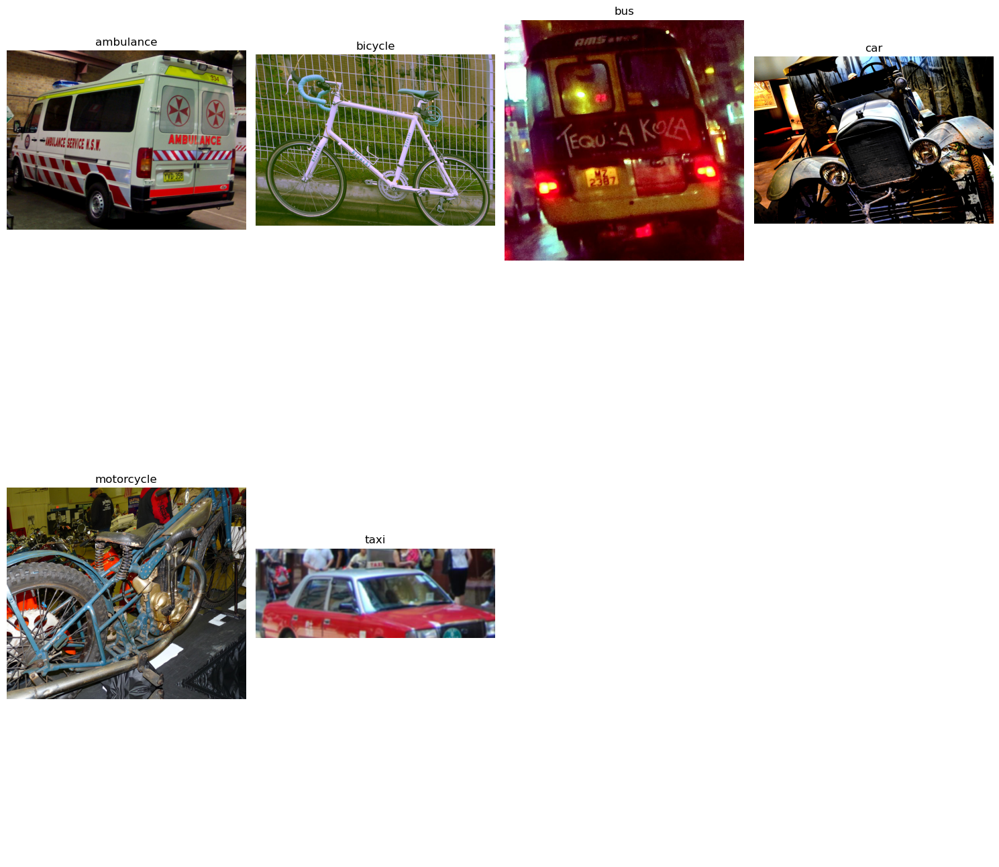

In [3]:
# Get the class labels and their corresponding indices
class_labels = train_generator.class_indices

# Create a dictionary to store the first image path from each class
class_image_paths = {}

# Iterate over the train generator to find the first image path from each class
for i in range(len(train_generator)):
    # Get the image and label from the generator
    image, label = train_generator[i]

    # Get the class label index
    class_index = label.argmax()

    # Get the class label name
    class_name = list(class_labels.keys())[class_index]

    # If the class is not yet added to the dictionary, store its image path
    if class_name not in class_image_paths:
        image_path = train_generator.filepaths[i]
        class_image_paths[class_name] = image_path

    # If images from all classes are found, break the loop
    if len(class_image_paths) == len(class_labels):
        break

# Create a grid of subplots
fig, axs = plt.subplots(len(class_image_paths) // 4 + 1, 4, figsize=(15, 15))

# Flatten the axs array for easier indexing
axs = axs.flatten()

# Display the images from each class
for i, (class_name, image_path) in enumerate(class_image_paths.items()):
    # Load the image
    image = plt.imread(image_path)

    # Display the image in the corresponding subplot
    axs[i].imshow(image)
    axs[i].set_title(class_name)
    axs[i].axis('off')

    # Break the loop if all subplots are filled
    if i + 1 == len(axs):
        break

# Hide any remaining empty subplots
for j in range(len(class_image_paths), len(axs)):
    axs[j].axis('off')

# Adjust the spacing between subplots
plt.tight_layout()

# Show the plots
plt.show()


> Create and train the first model using data augumentaion

In [4]:
# Define the batch size
batch_size = 32

# Define the image data generator for the train set with data augmentation
train_datagen_aug = ImageDataGenerator(
    rescale=1.0/255,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True
)

# Load the images from the train folder using the augmented data generator
train_generator_aug = train_datagen_aug.flow_from_directory(
    os.path.join("C:/Users/sofiy/vehicle_dataset/Train"),
    target_size=(64, 64),
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False
)

# Define the image data generator for the validation set (no augmentation for validation)
validation_datagen = ImageDataGenerator(rescale=1.0/255)

# Load the images from the validation folder using the data generator
validation_generator = validation_datagen.flow_from_directory(
    os.path.join("C:/Users/sofiy/vehicle_dataset/Validation"),    # Path to validation folder
    target_size=(64, 64),
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False
)

# Define the model
model2 = Sequential()
model2.add(Conv2D(64, (5, 5), activation='relu', input_shape=(64, 64, 3)))
model2.add(MaxPooling2D((2, 2)))
model2.add(Conv2D(32, (3, 3), activation='relu'))
model2.add(MaxPooling2D((2, 2)))
model2.add(Flatten())
model2.add(Dense(128, activation='relu'))
model2.add(Dense(6, activation='softmax'))

# Compile the model
model2.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Train the new model using the train generator with data augmentation
fit2 = model2.fit(train_generator_aug, epochs=100, batch_size=batch_size, validation_data=validation_generator)


Found 3394 images belonging to 6 classes.
Found 1127 images belonging to 6 classes.
Epoch 1/100
107/107 [==============================] - 111s 1s/step - loss: 1.8008 - accuracy: 0.1959 - val_loss: 1.7737 - val_accuracy: 0.2626
Epoch 2/100
107/107 [==============================] - 104s 972ms/step - loss: 1.7694 - accuracy: 0.3100 - val_loss: 1.6987 - val_accuracy: 0.2626
Epoch 3/100
107/107 [==============================] - 107s 1s/step - loss: 1.6606 - accuracy: 0.3332 - val_loss: 1.7130 - val_accuracy: 0.2626
Epoch 4/100
107/107 [==============================] - 104s 972ms/step - loss: 1.7502 - accuracy: 0.3462 - val_loss: 1.6723 - val_accuracy: 0.2626
Epoch 5/100
107/107 [==============================] - 108s 1s/step - loss: 1.6450 - accuracy: 0.3462 - val_loss: 1.6819 - val_accuracy: 0.2626
Epoch 6/100
107/107 [==============================] - 103s 965ms/step - loss: 1.6639 - accuracy: 0.3689 - val_loss: 1.6048 - val_accuracy: 0.3416
Epoch 7/100
107/107 [======================

> Produce the learning curves

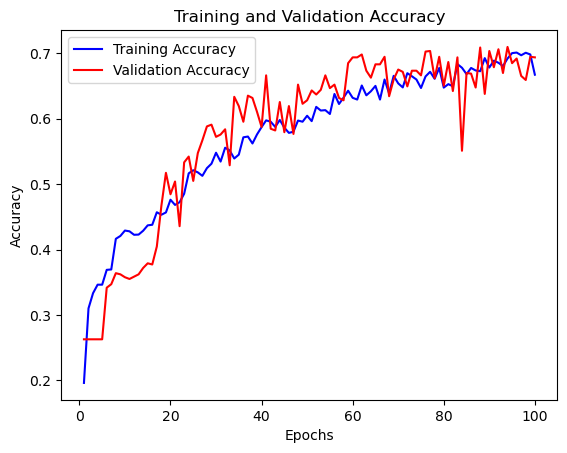

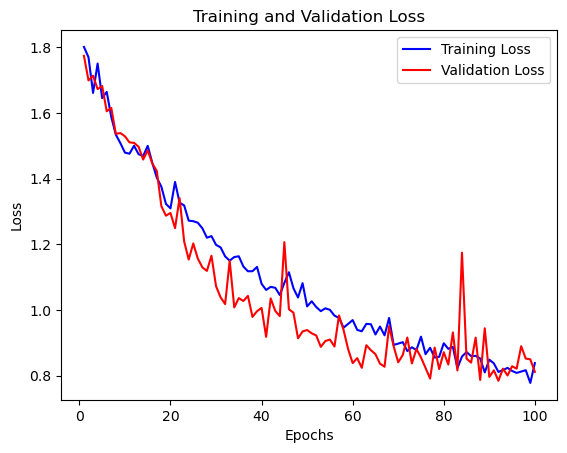

In [5]:
# Access the training history
history = fit2.history

# Get the training and validation accuracy values
train_acc = history['accuracy']
val_acc = history['val_accuracy']

# Get the training and validation loss values
train_loss = history['loss']
val_loss = history['val_loss']

# Plot the training and validation accuracy
plt.plot(range(1, len(train_acc) + 1), train_acc, 'b-', label='Training Accuracy')
plt.plot(range(1, len(val_acc) + 1), val_acc, 'r-', label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()
plt.show()

# Plot the training and validation loss
plt.plot(range(1, len(train_loss) + 1), train_loss, 'b-', label='Training Loss')
plt.plot(range(1, len(val_loss) + 1), val_loss, 'r-', label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.show()

> Get the Accuracy and loss for training and validation data

In [8]:
# Access the training history
history = fit2.history

# Get the training and validation accuracy and loss values at the last epoch
final_train_acc = history['accuracy'][-1]
final_val_acc = history['val_accuracy'][-1]
final_train_loss = history['loss'][-1]
final_val_loss = history['val_loss'][-1]

# Print the metrics at convergence
print("Final Training Accuracy:", final_train_acc)
print("Final Validation Accuracy:", final_val_acc)
print("Final Training Loss:", final_train_loss)
print("Final Validation Loss:", final_val_loss)

Final Training Accuracy: 0.667354166507721
Final Validation Accuracy: 0.6938775777816772
Final Training Loss: 0.8379225134849548
Final Validation Loss: 0.8112552762031555


> Load in the images in the test folder 

In [18]:
# Define the path to the test folder
test_folder = 'C:/Users/sofiy/vehicle_dataset/Test2'

# Initialize lists to store test images and labels
test_images = []
test_labels = []

# Load and preprocess test images
for class_label in os.listdir(test_folder):
    class_folder = os.path.join(test_folder, class_label)
    for image_file in os.listdir(class_folder):
        image_path = os.path.join(class_folder, image_file)
        image = load_img(image_path, target_size=(64, 64))
        image = img_to_array(image) / 255.0
        test_images.append(image)
        test_labels.append(class_label)

# Convert lists to NumPy arrays
test_images = np.array(test_images)
test_labels = np.array(test_labels)

In [19]:
# Make predictions on the test images
predictions = model2.predict(test_images)

8/8 [==============================] - 0s 19ms/step


> Create the confusion matrix and get the precion

In [23]:
# Convert one-hot encoded predictions to class labels
predicted_labels = np.argmax(predictions, axis=1)

# Convert class labels to integers for both test_labels and predicted_labels
label_mapping = {label: idx for idx, label in enumerate(np.unique(test_labels))}
test_labels_int = np.array([label_mapping[label] for label in test_labels])
predicted_labels_int = predicted_labels

# Calculate the confusion matrix and precision
conf_matrix = confusion_matrix(test_labels_int, predicted_labels_int)
precision = precision_score(test_labels_int, predicted_labels_int, average='weighted')

print("Confusion Matrix:")
print(conf_matrix)
print("Precision:", precision)

Confusion Matrix:
[[ 3  0  4  8  5  0]
 [ 0 22  0  1 27  0]
 [ 2  0 41  4  2  1]
 [ 0  1  4 25 14  6]
 [ 0  3  1  2 43  1]
 [ 2  0  4  2  0 11]]
Precision: 0.6411312227211808


In [24]:
# Calculate test accuracy
test_accuracy = accuracy_score(test_labels_int, predicted_labels_int)
print("Test Accuracy:", test_accuracy)

Test Accuracy: 0.606694560669456


> Loop through test folder and predict the classes of each image

1/1 [==============================] - 0s 29ms/step


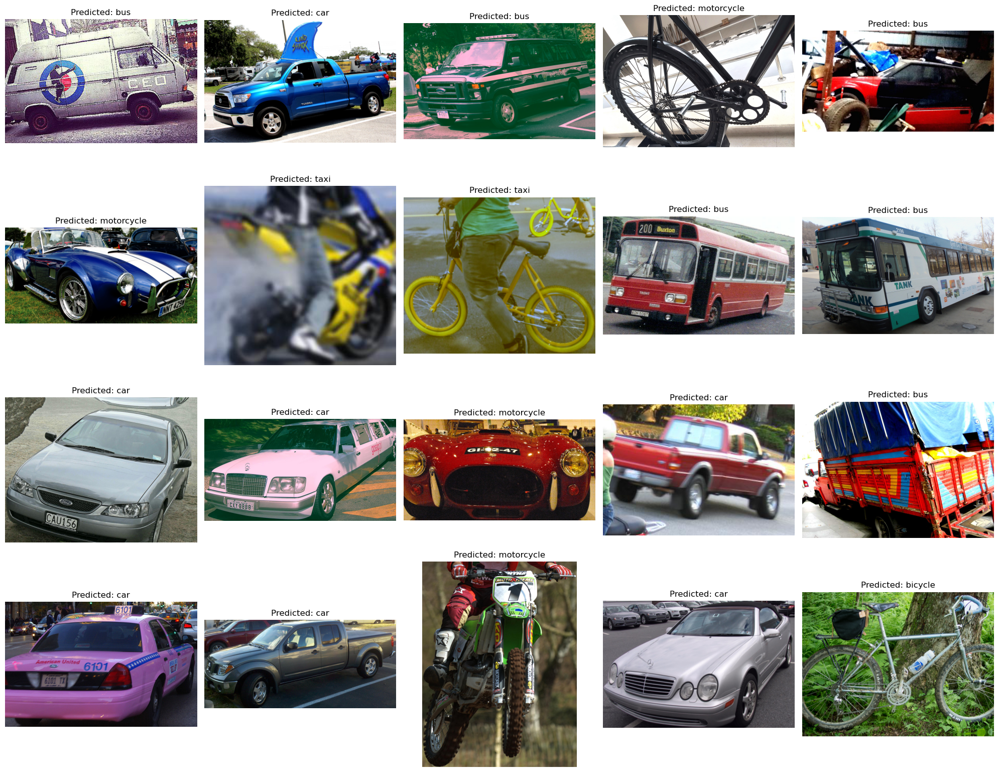

In [7]:
# Define the path to the test folder
test_folder = 'C:/Users/sofiy/vehicle_dataset/Test'

# Get the class labels from the train generator
class_labels = list(train_generator.class_indices.keys())

# Function to load and preprocess a single image
def preprocess_image(image_path):
    image = load_img(image_path, target_size=(64, 64))
    image = img_to_array(image) / 255.0
    image = np.expand_dims(image, axis=0)
    return image

# Function to plot images with their predicted classes
def plot_images_with_predictions(images, predictions, class_labels, num_images_per_row=5):
    num_images = len(images)
    num_rows = (num_images + num_images_per_row - 1) // num_images_per_row

    plt.figure(figsize=(20, 4 * num_rows))

    for i in range(num_images):
        plt.subplot(num_rows, num_images_per_row, i + 1)
        plt.imshow(images[i])
        plt.axis('off')
        predicted_class = class_labels[np.argmax(predictions[i])]
        plt.title(f"Predicted: {predicted_class}")

    plt.tight_layout()
    plt.show()

# Initialize lists to store images and their predictions
test_images = []
test_predictions = []

# Loop through the images in the test folder and make predictions
for image_file in os.listdir(test_folder):
    image_path = os.path.join(test_folder, image_file)
    image = preprocess_image(image_path)
    prediction = model2.predict(image)
    test_images.append(load_img(image_path))
    test_predictions.append(prediction)

# Convert the list of predictions to a numpy array
test_predictions = np.vstack(test_predictions)

# Plot the images with their predicted classes in rows of 5
plot_images_with_predictions(test_images, test_predictions, class_labels, num_images_per_row=5)


> Create and train the second model using data augumentaion

In [25]:
# Define the batch size
batch_size = 32

# Define the image data generator for the train set with data augmentation
train_datagen_aug = ImageDataGenerator(
    rescale=1.0/255,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True
)

# Load the images from the train folder using the augmented data generator
train_generator_aug = train_datagen_aug.flow_from_directory(
    os.path.join("C:/Users/sofiy/vehicle_dataset/Train"),     # path to train data
    target_size=(64, 64),
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=True  # Shuffle the data during training
)

# Define the model with 3 convolutional layers and a dense layer
model = Sequential()
model.add(Conv2D(64, (3, 3), activation='relu', input_shape=(64, 64, 3)))
model.add(MaxPooling2D((2, 2)))
model.add(Conv2D(128, (3, 3), activation='relu'))
model.add(MaxPooling2D((2, 2)))
model.add(Conv2D(256, (3, 3), activation='relu'))
model.add(MaxPooling2D((2, 2)))
model.add(Flatten())
model.add(Dense(128, activation='relu'))
model.add(Dense(6, activation='softmax'))  

# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Train the model using the train generator with data augmentation
fit = model.fit(train_generator_aug, epochs=100, batch_size=batch_size, validation_data=validation_generator)


Found 3394 images belonging to 6 classes.
Epoch 1/100
107/107 [==============================] - 161s 1s/step - loss: 1.4978 - accuracy: 0.4125 - val_loss: 1.3555 - val_accuracy: 0.4676
Epoch 2/100
107/107 [==============================] - 142s 1s/step - loss: 1.2901 - accuracy: 0.5068 - val_loss: 1.5702 - val_accuracy: 0.4277
Epoch 3/100
107/107 [==============================] - 146s 1s/step - loss: 1.1906 - accuracy: 0.5480 - val_loss: 1.0535 - val_accuracy: 0.5980
Epoch 4/100
107/107 [==============================] - 140s 1s/step - loss: 1.1582 - accuracy: 0.5566 - val_loss: 1.3118 - val_accuracy: 0.4499
Epoch 5/100
107/107 [==============================] - 146s 1s/step - loss: 1.0826 - accuracy: 0.5934 - val_loss: 1.0891 - val_accuracy: 0.5670
Epoch 6/100
107/107 [==============================] - 145s 1s/step - loss: 1.0336 - accuracy: 0.6137 - val_loss: 1.0256 - val_accuracy: 0.6016
Epoch 7/100
107/107 [==============================] - 141s 1s/step - loss: 0.9889 - accuracy:

> Produce the learning curves

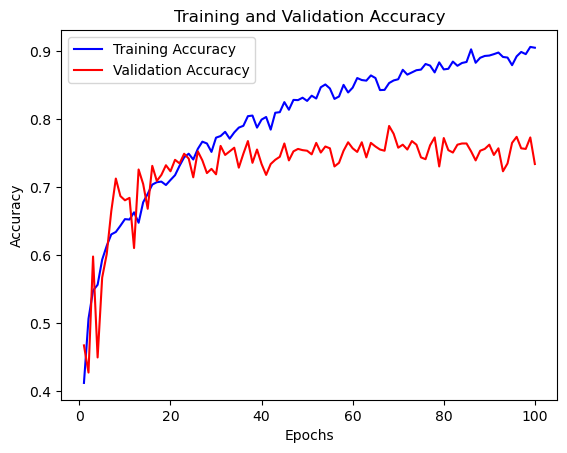

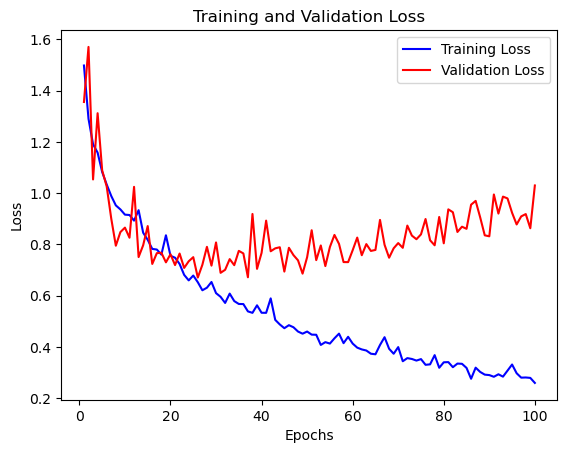

In [26]:
# Access the training history
history = fit.history

# Get the training and validation accuracy values
train_acc = history['accuracy']
val_acc = history['val_accuracy']

# Get the training and validation loss values
train_loss = history['loss']
val_loss = history['val_loss']

# Plot the training and validation accuracy
plt.plot(range(1, len(train_acc) + 1), train_acc, 'b-', label='Training Accuracy')
plt.plot(range(1, len(val_acc) + 1), val_acc, 'r-', label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()
plt.show()

# Plot the training and validation loss
plt.plot(range(1, len(train_loss) + 1), train_loss, 'b-', label='Training Loss')
plt.plot(range(1, len(val_loss) + 1), val_loss, 'r-', label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.show()

> Get the Accuracy and loss for training and validation data

In [27]:
# Access the training history
history = fit.history

# Get the training and validation accuracy and loss values at the last epoch
final_train_acc = history['accuracy'][-1]
final_val_acc = history['val_accuracy'][-1]
final_train_loss = history['loss'][-1]
final_val_loss = history['val_loss'][-1]

# Print the metrics at convergence
print("Final Training Accuracy:", final_train_acc)
print("Final Validation Accuracy:", final_val_acc)
print("Final Training Loss:", final_train_loss)
print("Final Validation Loss:", final_val_loss)

Final Training Accuracy: 0.9045374393463135
Final Validation Accuracy: 0.7338065505027771
Final Training Loss: 0.260242760181427
Final Validation Loss: 1.0300655364990234


In [28]:
# Make predictions on the test images
predictions = model.predict(test_images)

8/8 [==============================] - 0s 39ms/step


> Create the confusion matrix and get the precision

In [29]:
# Convert one-hot encoded predictions to class labels
predicted_labels = np.argmax(predictions, axis=1)

# Convert class labels to integers for both test_labels and predicted_labels
label_mapping = {label: idx for idx, label in enumerate(np.unique(test_labels))}
test_labels_int = np.array([label_mapping[label] for label in test_labels])
predicted_labels_int = predicted_labels

# Calculate the confusion matrix and precision
conf_matrix = confusion_matrix(test_labels_int, predicted_labels_int)
precision = precision_score(test_labels_int, predicted_labels_int, average='weighted')

print("Confusion Matrix:")
print(conf_matrix)
print("Precision:", precision)

Confusion Matrix:
[[ 6  0  4  9  1  0]
 [ 0 41  0  2  7  0]
 [ 2  1 30 13  0  4]
 [ 1  3  3 38  3  2]
 [ 0 13  2  5 30  0]
 [ 1  0  0  5  0 13]]
Precision: 0.6769063631393004


In [30]:
# Calculate test accuracy
test_accuracy = accuracy_score(test_labels_int, predicted_labels_int)
print("Test Accuracy:", test_accuracy)

Test Accuracy: 0.6610878661087866


> Loop through test folder and predict the classes of each image

1/1 [==============================] - 0s 32ms/step


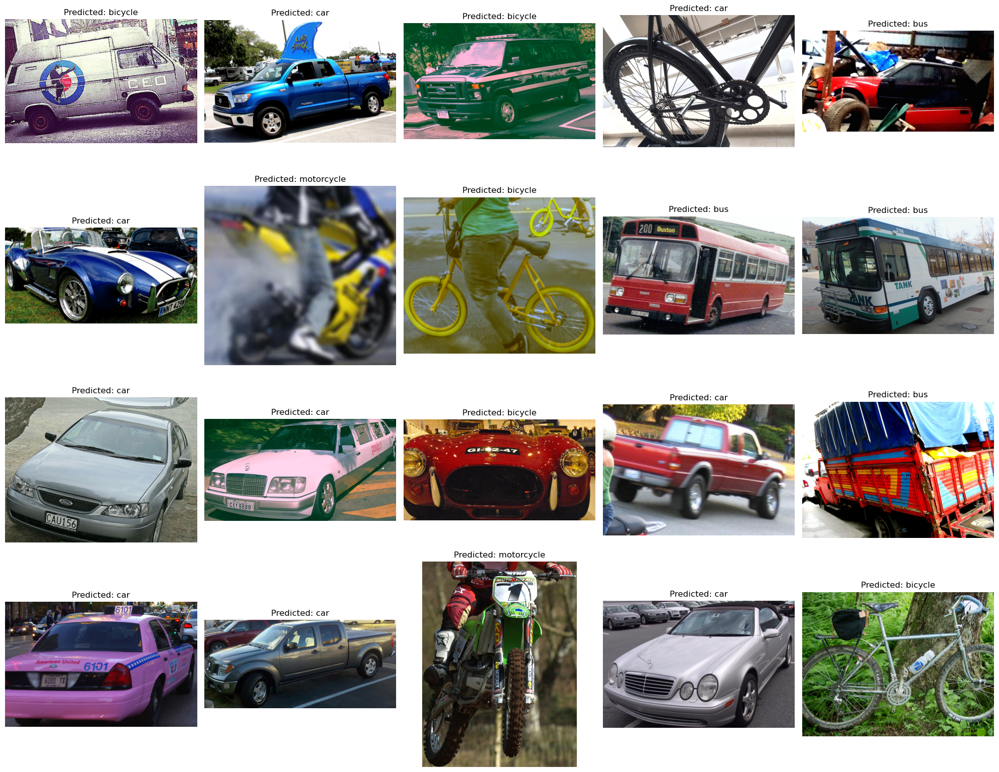

In [31]:
# Define the path to the test folder
test_folder = 'C:/Users/sofiy/vehicle_dataset/Test'

# Get the class labels from the train generator
class_labels = list(train_generator.class_indices.keys())

# Function to load and preprocess a single image
def preprocess_image(image_path):
    image = load_img(image_path, target_size=(64, 64))
    image = img_to_array(image) / 255.0
    image = np.expand_dims(image, axis=0)
    return image

# Function to plot images with their predicted classes
def plot_images_with_predictions(images, predictions, class_labels, num_images_per_row=5):
    num_images = len(images)
    num_rows = (num_images + num_images_per_row - 1) // num_images_per_row

    plt.figure(figsize=(20, 4 * num_rows))

    for i in range(num_images):
        plt.subplot(num_rows, num_images_per_row, i + 1)
        plt.imshow(images[i])
        plt.axis('off')
        predicted_class = class_labels[np.argmax(predictions[i])]
        plt.title(f"Predicted: {predicted_class}")

    plt.tight_layout()
    plt.show()

# Initialize lists to store images and their predictions
test_images = []
test_predictions = []

# Loop through the images in the test folder and make predictions
for image_file in os.listdir(test_folder):
    image_path = os.path.join(test_folder, image_file)
    image = preprocess_image(image_path)
    prediction = model.predict(image)
    test_images.append(load_img(image_path))
    test_predictions.append(prediction)

# Convert the list of predictions to a numpy array
test_predictions = np.vstack(test_predictions)

# Plot the images with their predicted classes in rows of 5
plot_images_with_predictions(test_images, test_predictions, class_labels, num_images_per_row=5)